<a href="https://colab.research.google.com/github/nickname8888/Quaternions-LPI/blob/main/LP_gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
import os

In [ ]:
batch_size = 16

In [ ]:
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/drive/MyDrive/datasets/license plates/in/',
    batch_size = batch_size, image_size = (64, 128),
    label_mode=None,
    # seed=111, validation_split=0.2, subset='training'
)
train_dataset = train_dataset.map(lambda x: x / 255.0)

Found 1182 files belonging to 1 classes.


In [ ]:
train_dataset2 = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/drive/MyDrive/datasets/license plates/in/',
    batch_size = batch_size, image_size = (64, 128),
    label_mode=None,
    color_mode='grayscale'
    # seed=111, validation_split=0.2, subset='training'
)
train_dataset2 = train_dataset2.map(lambda x: x / 255.0)

Found 1182 files belonging to 1 classes.


In [ ]:
# for a, b in train_dataset:
#   print(a)
#   print(b)
#   break
len(train_dataset)

1969

In [ ]:
dataset_new = train_dataset.take(500)

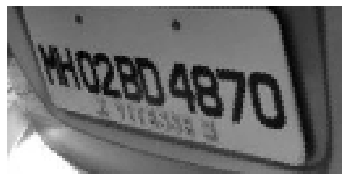

In [ ]:
for x in train_dataset2:
    plt.axis("off")
    plt.imshow((x.numpy() * 255).astype("int32")[0].reshape(64, 128), interpolation='nearest', cmap='gray')
    break

In [ ]:
import os
os.chdir('/content/drive/MyDrive/datasets/models/LP-in-3')

In [ ]:
def create_discriminator():
  model = tf.keras.models.Sequential()
  model.add(layers.Conv2D(32, 5, 1, activation='relu', input_shape=(64, 128, 1)))
  model.add(layers.Conv2D(64, 3, 1, activation='relu'))
  model.add(layers.Dropout(0.2))
  model.add(layers.MaxPool2D())
  model.add(layers.Conv2D(96, 3, 1, activation='relu'))
  model.add(layers.Dropout(0.2))
  model.add(layers.MaxPool2D())
  model.add(layers.Conv2D(128, 3, 1, activation='relu'))
  model.add(layers.Dropout(0.3))
  model.add(layers.MaxPool2D())
  model.add(layers.Conv2D(128, 3, 2, activation='relu'))
  model.add(layers.Dropout(0.3))
  # model.add(layers.MaxPool2D())
  model.add(layers.Flatten())
  # model.add(layers.Dense(256, activation='relu'))
  # model.add(layers.Dropout(0.3))
  model.add(layers.Dense(128, activation='relu'))
  model.add(layers.Dropout(0.3))
  model.add(layers.Dense(1))
  
  return model

In [ ]:
d = create_discriminator()
d.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 60, 124, 32)       832       
                                                                 
 conv2d_19 (Conv2D)          (None, 58, 122, 64)       18496     
                                                                 
 dropout_16 (Dropout)        (None, 58, 122, 64)       0         
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 29, 61, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 27, 59, 96)        55392     
                                                                 
 dropout_17 (Dropout)        (None, 27, 59, 96)        0         
                                                      

In [ ]:
def create_generator():
    model = tf.keras.Sequential()
    
    # creating Dense layer with units 7*7*256(batch_size) and input_shape of (100,)
    model.add(layers.Dense(8*8, use_bias=False, input_shape=(100,)))
    # model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Dense(16*8, use_bias=False, input_shape=(100,)))
    # model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 16, 1)))

    model.add(layers.Conv2DTranspose(32, 3, strides=(1, 1), padding='same', use_bias=False))
    # model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, 3, strides=(2, 2), padding='same', use_bias=False))
    # model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, 3, strides=(2, 2), padding='same', use_bias=False))
    # model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(128, 3, strides=(2, 2), padding='same', use_bias=False))
    # model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(128, 3, strides=(2, 2), padding='same', use_bias=False))
    # model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # model.add(layers.Conv2DTranspose(256, 3, strides=(2, 2), padding='same', use_bias=False))
    # model.add(layers.BatchNormalization())
    # model.add(layers.LeakyReLU())

    model.add(layers.Conv2D(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))

    return model

In [ ]:
g = create_generator()
g.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 64)                6400      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 128)               8192      
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 128)               0         
                                                                 
 reshape (Reshape)           (None, 8, 16, 1)          0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 16, 32)        288       
 nspose)                                                         
                                                      

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def d_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
  return real_loss + fake_loss

def g_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output), fake_output)

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [ ]:
noise_dim = 100
num_of_generated_samples = 16
seed = tf.random.normal([num_of_generated_samples, noise_dim])

In [ ]:
generator = create_generator()
discriminator = create_discriminator()

In [ ]:
discriminator = create_discriminator()

In [ ]:
@tf.function
def train_step(images):
  global generator, discriminator
  noise = tf.random.normal([num_of_generated_samples, noise_dim])

  with tf.GradientTape() as gtape, tf.GradientTape() as dtape:
    generated_images = generator(noise, training=True)
    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)
    gloss = g_loss(fake_output)
    dloss = d_loss(real_output, fake_output)
  generator_gradient = gtape.gradient(gloss, generator.trainable_variables)
  discriminator_gradient = dtape.gradient(dloss, discriminator.trainable_variables)
  generator_optimizer.apply_gradients(zip(generator_gradient, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradient, discriminator.trainable_variables))

In [ ]:
from tqdm import tqdm

def train_gan(dataset, epochs):
  for epoch in range(epochs):
    print('started epoch ', epoch)
    for image_batch in tqdm(dataset):
      train_step(image_batch)
    
    noise = tf.random.normal([64, noise_dim])
    generated_images = generator.predict(noise)
    dim=(8,8)
    figsize=(10,10)
    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
      plt.subplot(dim[0], dim[1], i+1)
      plt.imshow(generated_images[i].reshape(64, 128), interpolation='nearest', cmap='gray')
      plt.axis('off')
    plt.tight_layout()
    plt.savefig('gan_generated_image '+ str(epoch+100) + '.png')

started epoch  0


100%|██████████| 74/74 [00:26<00:00,  2.83it/s]


started epoch  1


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  2


100%|██████████| 74/74 [00:23<00:00,  3.19it/s]


started epoch  3


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  4


100%|██████████| 74/74 [00:23<00:00,  3.21it/s]


started epoch  5


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  6


100%|██████████| 74/74 [00:23<00:00,  3.21it/s]


started epoch  7


100%|██████████| 74/74 [00:22<00:00,  3.24it/s]


started epoch  8


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  9


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  10


100%|██████████| 74/74 [00:23<00:00,  3.18it/s]


started epoch  11


100%|██████████| 74/74 [00:22<00:00,  3.23it/s]


started epoch  12


100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


started epoch  13


100%|██████████| 74/74 [00:23<00:00,  3.18it/s]


started epoch  14


100%|██████████| 74/74 [00:23<00:00,  3.19it/s]


started epoch  15


100%|██████████| 74/74 [00:23<00:00,  3.19it/s]


started epoch  16


100%|██████████| 74/74 [00:23<00:00,  3.14it/s]


started epoch  17


100%|██████████| 74/74 [00:22<00:00,  3.24it/s]


started epoch  18


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  19


100%|██████████| 74/74 [00:23<00:00,  3.15it/s]


started epoch  20


100%|██████████| 74/74 [00:40<00:00,  1.81it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


started epoch  21


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  22


100%|██████████| 74/74 [00:22<00:00,  3.24it/s]


started epoch  23


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  24


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  25


100%|██████████| 74/74 [00:23<00:00,  3.21it/s]


started epoch  26


100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


started epoch  27


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  28


100%|██████████| 74/74 [00:23<00:00,  3.21it/s]


started epoch  29


100%|██████████| 74/74 [00:23<00:00,  3.19it/s]


started epoch  30


100%|██████████| 74/74 [00:23<00:00,  3.19it/s]


started epoch  31


100%|██████████| 74/74 [00:22<00:00,  3.22it/s]


started epoch  32


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  33


100%|██████████| 74/74 [00:23<00:00,  3.18it/s]


started epoch  34


100%|██████████| 74/74 [00:23<00:00,  3.16it/s]


started epoch  35


100%|██████████| 74/74 [00:23<00:00,  3.21it/s]


started epoch  36


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  37


100%|██████████| 74/74 [00:23<00:00,  3.21it/s]


started epoch  38


100%|██████████| 74/74 [00:23<00:00,  3.21it/s]


started epoch  39


100%|██████████| 74/74 [00:22<00:00,  3.22it/s]


started epoch  40


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  41


100%|██████████| 74/74 [00:22<00:00,  3.22it/s]


started epoch  42


100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


started epoch  43


100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


started epoch  44


100%|██████████| 74/74 [00:23<00:00,  3.21it/s]


started epoch  45


100%|██████████| 74/74 [00:22<00:00,  3.25it/s]


started epoch  46


100%|██████████| 74/74 [00:23<00:00,  3.21it/s]


started epoch  47


100%|██████████| 74/74 [00:23<00:00,  3.21it/s]


started epoch  48


100%|██████████| 74/74 [00:22<00:00,  3.24it/s]


started epoch  49


100%|██████████| 74/74 [00:23<00:00,  3.16it/s]


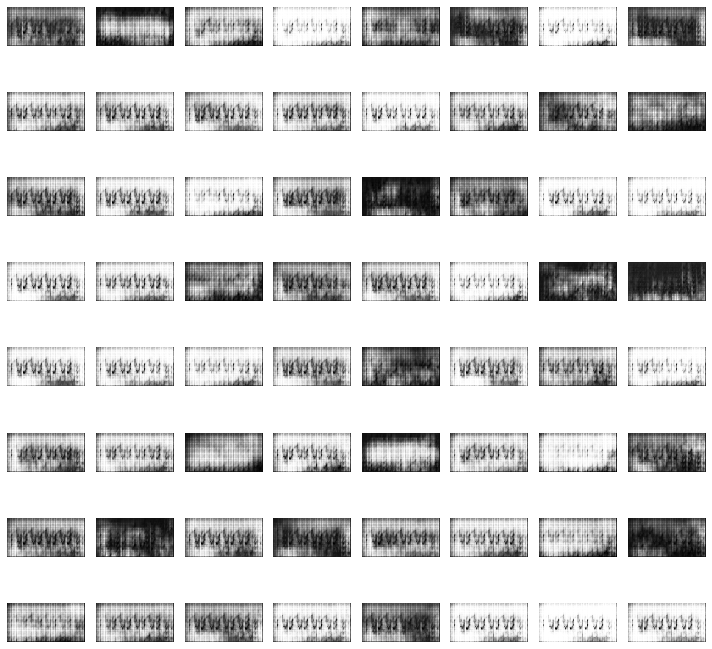

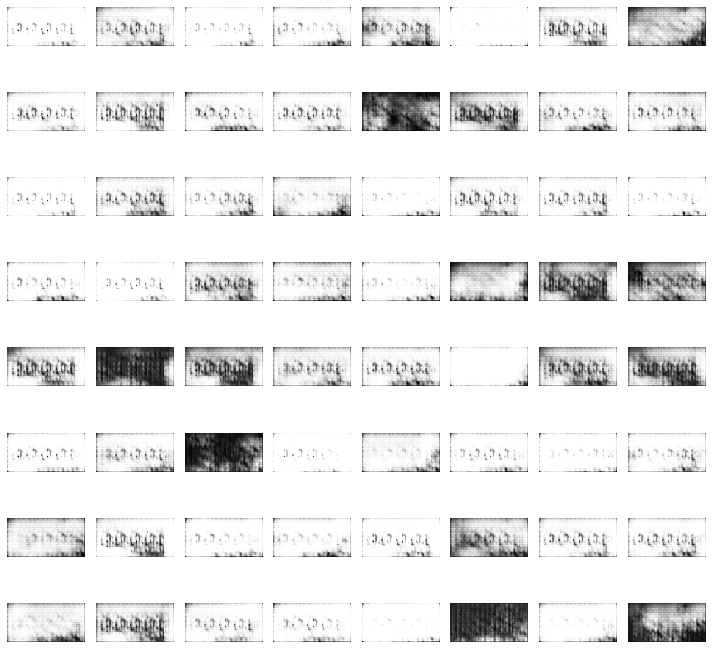

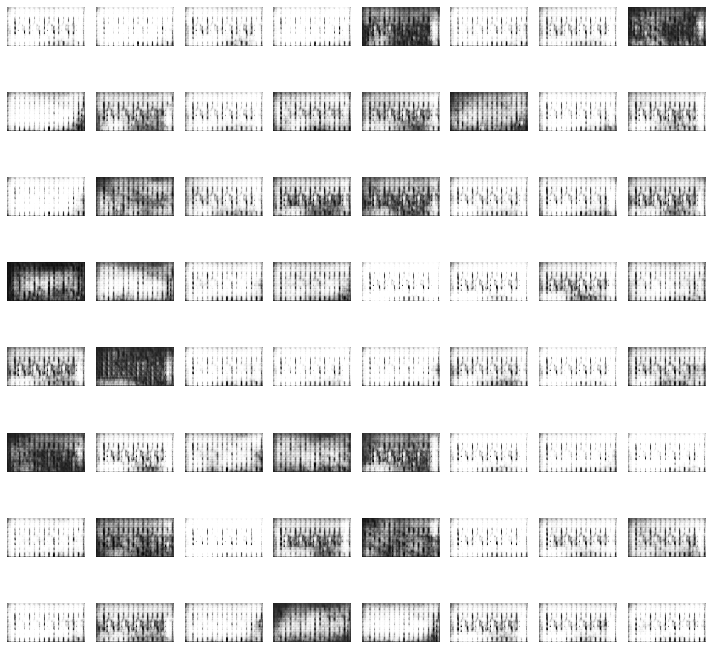

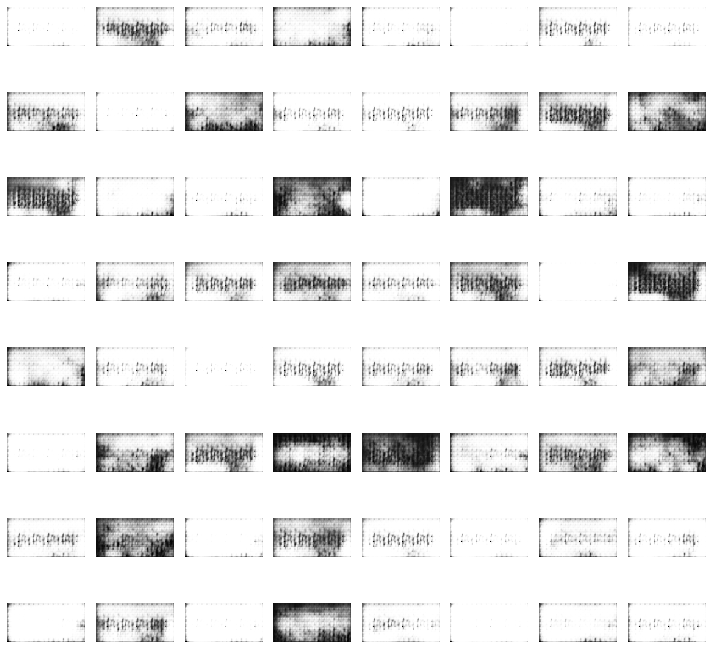

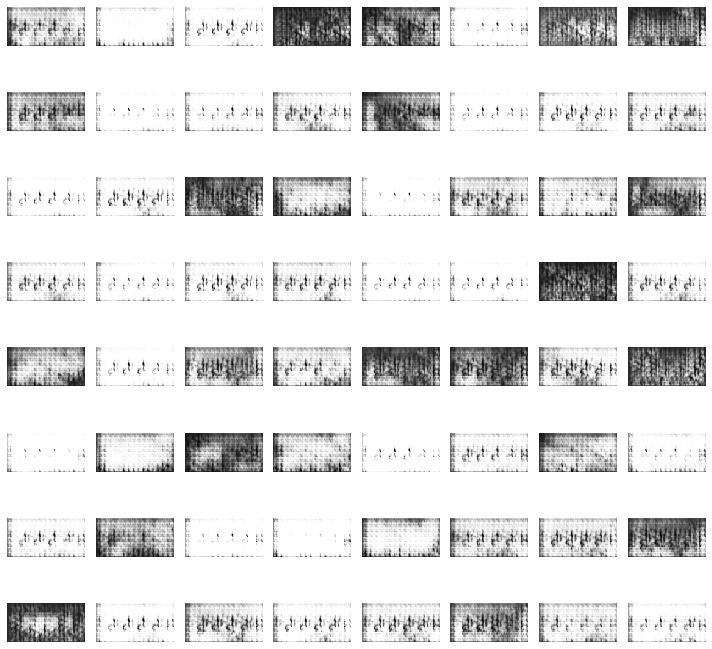

...

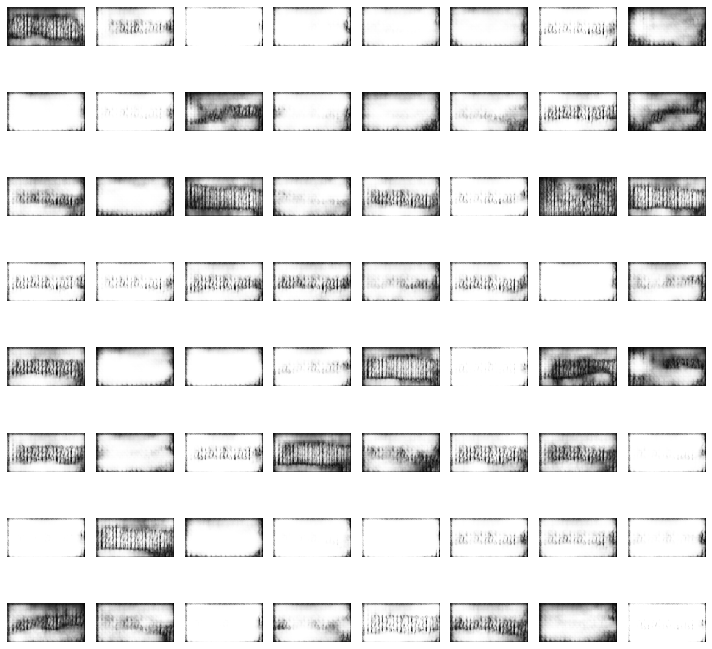

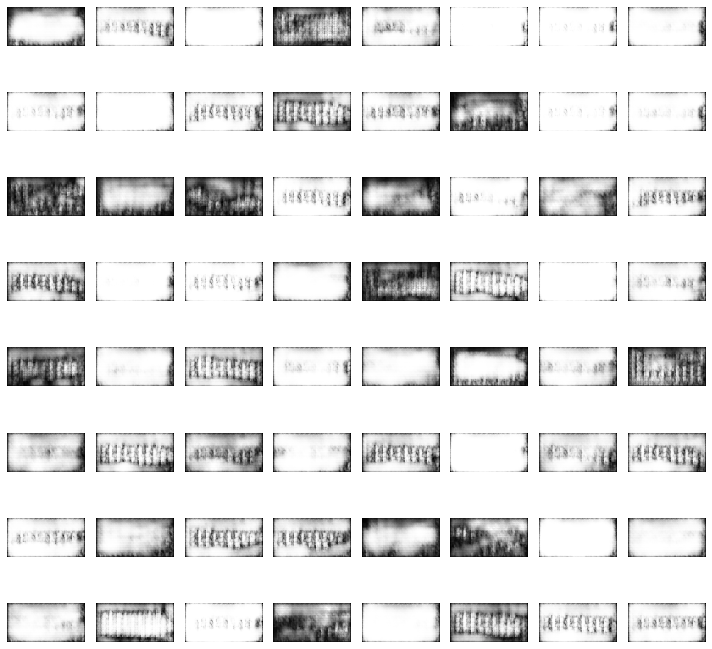

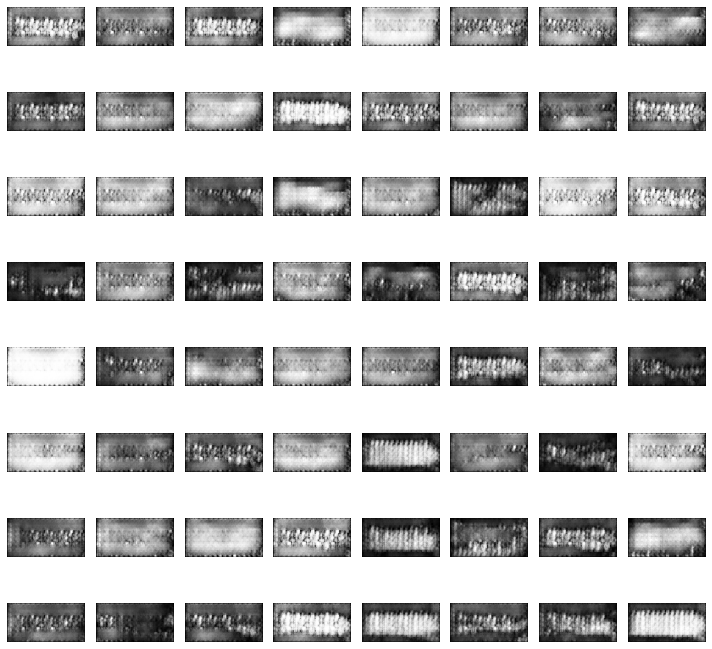

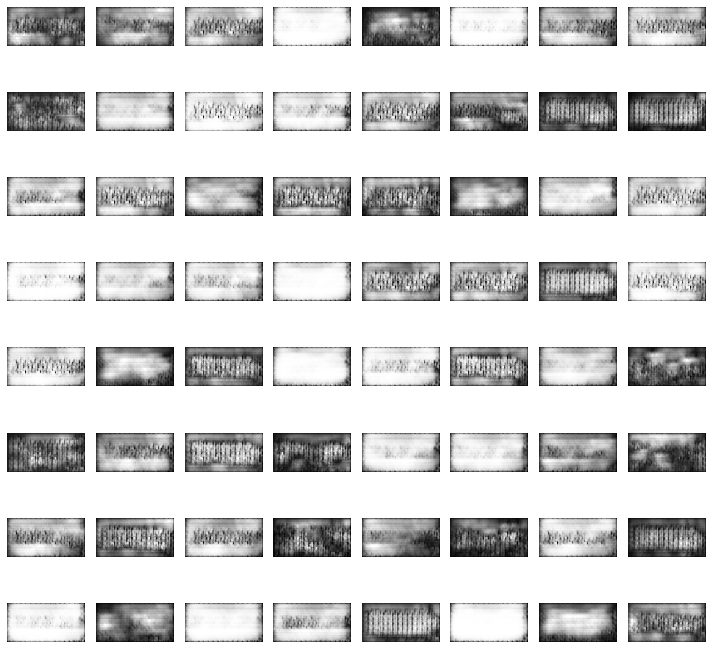

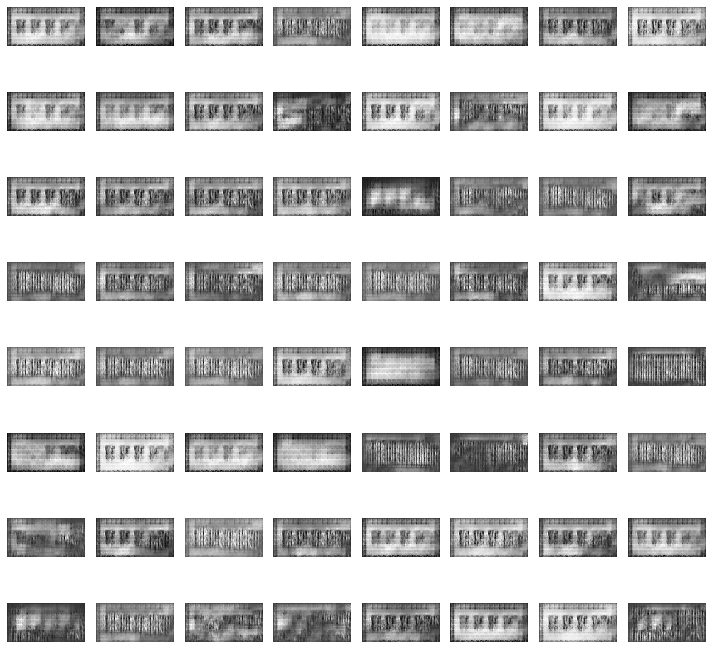

In [ ]:
train_gan(train_dataset2, 50)

In [ ]:
generator.save('LP-gan-3-g-epoch150.h5')
# discriminator.save('LP-gan-3-d-epoch100.h5')